# Gold Portfolio Risk and Returns (Coronavirus)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

import warnings
warnings.filterwarnings("ignore")

# fix_yahoo_finance is used to fetch data 
import yfinance as yf
yf.pdr_override()

In [2]:
# input
# Gold Stocks
symbols = ['AEM','AG','AGI','AU','AUG','AUY','AXU','BTG','CDE','CMCL','DRD','EGO','EXK','FNV','FSM','GFI','GOLD','GORO','GSS','GSV','HMY','IAG','KGC','KL','MAG','MUX','NEM','NG','OR','PAAS','PLG','PVG','RGLD','SA','SAND','SILV','SVM','TMQ','USAU','WPM']
start = '2019-12-01'
end = '2020-05-13'

In [3]:
df = pd.DataFrame()
for s in symbols:
    df[s] = yf.download(s,start,end)['Adj Close']

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [4]:
from datetime import datetime
from dateutil import relativedelta

d1 = datetime.strptime(start, "%Y-%m-%d")
d2 = datetime.strptime(end, "%Y-%m-%d")
delta = relativedelta.relativedelta(d2,d1)
print('How many years of investing?')
print('%s years' % delta.years)

How many years of investing?
0 years


In [5]:
number_of_years = delta.years

In [6]:
days = (df.index[-1] - df.index[0]).days
days

162

In [7]:
df.head()

,AEM,AG,AGI,AU,AUG,AUY,AXU,BTG,CDE,CMCL,...,PLG,PVG,RGLD,SA,SAND,SILV,SVM,TMQ,USAU,WPM
Date,,,,,,,,,,,,,,,,,,,,,
2019-12-02,59.825211,10.91,5.628248,18.809914,1.310,3.644445,1.78,3.711770,6.60,7.852439,...,1.34,10.01,116.652649,12.68,6.72,5.72,5.08,1.77,8.4,27.750179
2019-12-03,61.448833,11.26,5.707799,19.843315,1.430,3.723888,1.96,3.711770,7.22,8.236687,...,1.35,10.32,117.587624,13.37,6.92,6.11,5.25,1.79,8.2,28.158710
2019-12-04,61.130085,11.03,5.648136,19.674393,1.450,3.733819,2.10,3.721748,7.29,8.177571,...,1.38,10.39,116.602921,13.20,6.80,6.11,5.25,1.81,8.3,27.939499
2019-12-05,61.179890,11.23,5.658097,19.714140,1.430,3.743749,2.02,3.721748,7.24,8.246539,...,1.39,10.35,117.329018,13.29,6.88,6.17,5.36,1.92,8.3,27.959427
2019-12-06,60.084190,10.47,5.369215,18.650928,1.424,3.535211,1.92,3.621969,6.79,8.098752,...,1.36,10.13,113.042068,12.69,6.66,6.04,5.13,1.96,8.2,27.172258


In [8]:
df.tail()

,AEM,AG,AGI,AU,AUG,AUY,AXU,BTG,CDE,CMCL,...,PLG,PVG,RGLD,SA,SAND,SILV,SVM,TMQ,USAU,WPM
Date,,,,,,,,,,,,,,,,,,,,,
2020-05-06,63.330002,7.94,8.23,25.549999,1.04,4.87,1.68,5.42,3.84,12.604763,...,1.36,8.30,126.620003,14.22,8.21,7.11,3.83,1.60,5.04,42.020000
2020-05-07,65.540001,8.37,8.53,26.260000,1.08,5.07,1.79,5.67,4.06,13.409957,...,1.39,8.64,135.970001,14.64,8.56,7.90,4.04,1.65,5.11,43.730000
2020-05-08,65.889999,8.28,8.27,26.170000,1.12,5.24,1.77,5.49,4.17,13.737998,...,1.43,8.54,136.429993,14.50,7.99,7.65,4.17,1.76,5.10,43.380001
2020-05-11,64.550003,7.80,7.93,25.190001,1.14,5.07,1.75,5.21,4.21,13.668414,...,1.40,8.26,132.839996,13.81,7.72,7.15,4.00,1.79,5.01,42.630001
2020-05-12,64.230003,7.91,7.84,25.290001,1.12,5.08,1.71,5.16,4.00,13.141559,...,1.41,8.36,128.809998,14.48,7.85,7.00,3.90,1.79,4.85,42.340000


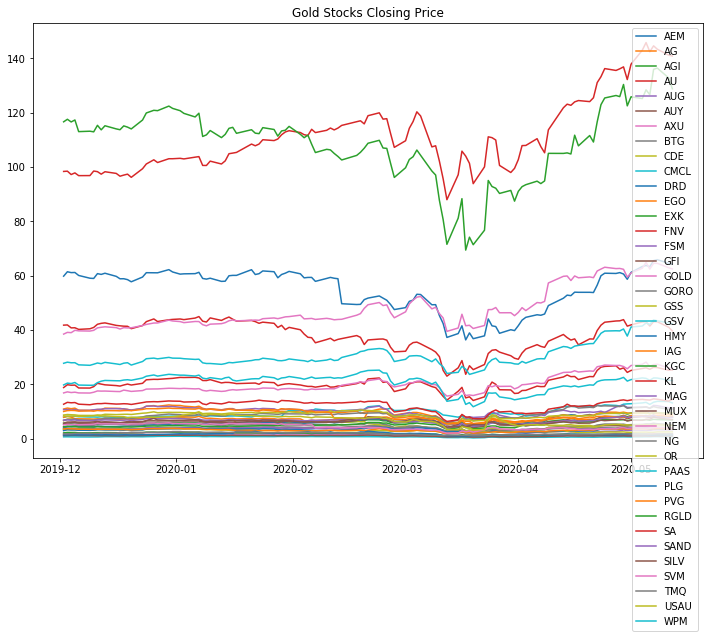

In [9]:
plt.figure(figsize=(12,8))
plt.plot(df)
plt.title('Gold Stocks Closing Price')
plt.legend(labels=df.columns)

In [10]:
# Normalize the data
normalize = (df - df.min())/ (df.max() - df.min())

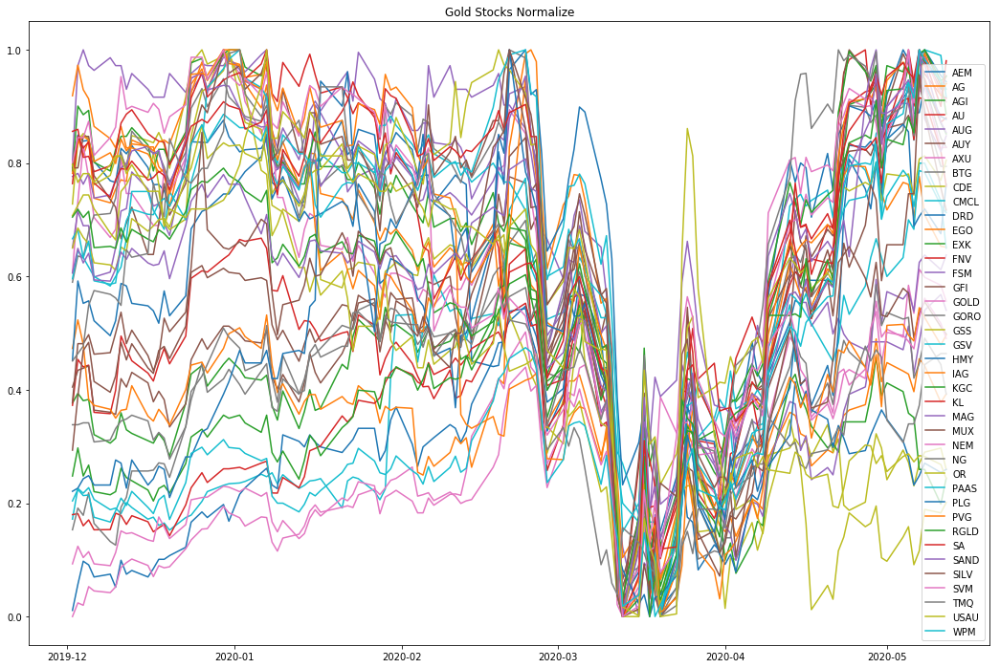

In [11]:
plt.figure(figsize=(18,12))
plt.plot(normalize)
plt.title('Gold Stocks Normalize')
plt.legend(labels=normalize.columns)

In [12]:
stock_rets = df.pct_change().dropna()

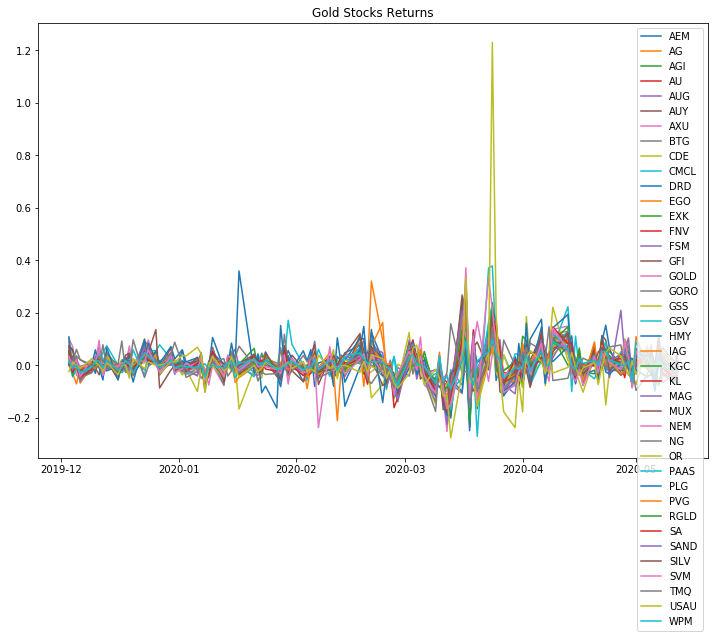

In [13]:
plt.figure(figsize=(12,8))
plt.plot(stock_rets)
plt.title('Gold Stocks Returns')
plt.legend(labels=stock_rets.columns)

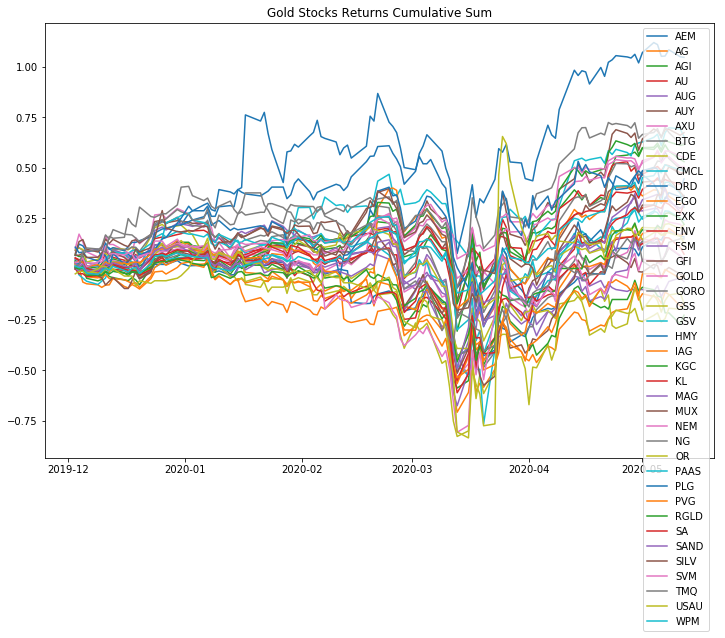

In [14]:
plt.figure(figsize=(12,8))
plt.plot(stock_rets.cumsum())
plt.title('Gold Stocks Returns Cumulative Sum')
plt.legend(labels=stock_rets.columns)

In [15]:
sns.set(style='ticks')
ax = sns.pairplot(stock_rets, diag_kind='hist')

nplot = len(stock_rets.columns)
for i in range(nplot) :
    for j in range(nplot) :
        ax.axes[i, j].locator_params(axis='x', nbins=6, tight=True)

In [16]:
ax = sns.PairGrid(stock_rets)
ax.map_upper(plt.scatter, color='purple')
ax.map_lower(sns.kdeplot, color='blue')
ax.map_diag(plt.hist, bins=30)
for i in range(nplot) :
    for j in range(nplot) :
        ax.axes[i, j].locator_params(axis='x', nbins=6, tight=True)

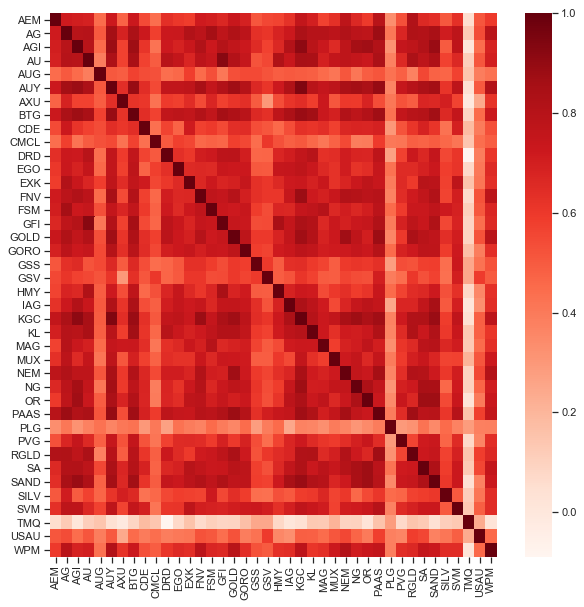

In [17]:
plt.figure(figsize=(10,10))
corr = stock_rets.corr()

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,
            cmap="Reds")

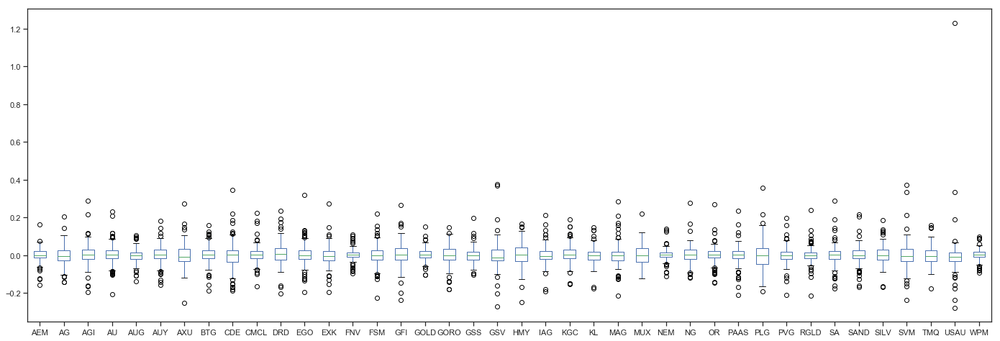

In [18]:
# Box plot
stock_rets.plot(kind='box',figsize=(24,8))

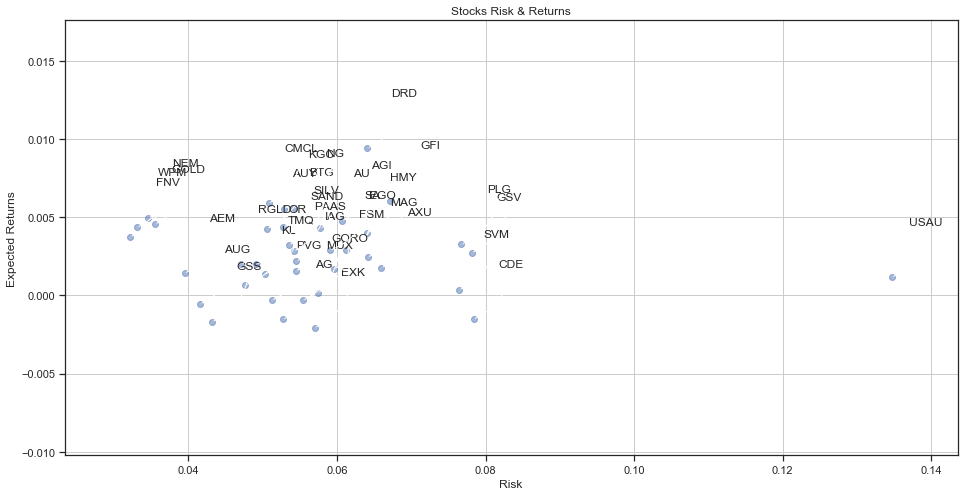

In [19]:
rets = stock_rets.dropna()

plt.figure(figsize=(16,8))
plt.scatter(rets.std(), rets.mean(),alpha = 0.5)

plt.title('Stocks Risk & Returns')
plt.xlabel('Risk')
plt.ylabel('Expected Returns')
plt.grid(which='major')

for label, x, y in zip(rets.columns, rets.std(), rets.mean()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (50, 50),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        arrowprops = dict(arrowstyle = '-', connectionstyle = 'arc3,rad=-0.3'))

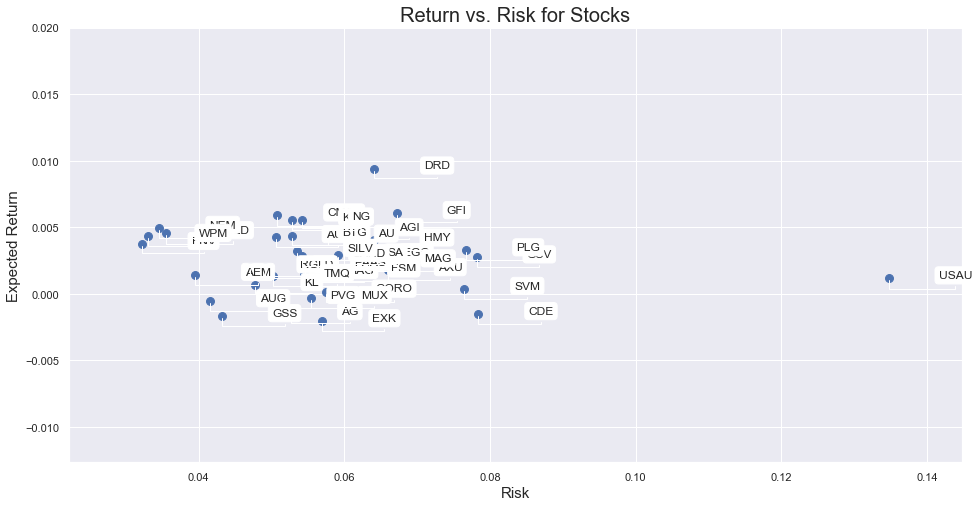

In [20]:
rets = stock_rets.dropna()
area = np.pi*20.0

sns.set(style='darkgrid')
plt.figure(figsize=(16,8))
plt.scatter(rets.std(), rets.mean(), s=area)
plt.xlabel("Risk", fontsize=15)
plt.ylabel("Expected Return", fontsize=15)
plt.title("Return vs. Risk for Stocks", fontsize=20)

for label, x, y in zip(rets.columns, rets.std(), rets.mean()) : 
    plt.annotate(label, xy=(x,y), xytext=(50, 0), textcoords='offset points',
                arrowprops=dict(arrowstyle='-', connectionstyle='bar,angle=180,fraction=-0.2'),
                bbox=dict(boxstyle="round", fc="w"))

In [21]:
rest_rets = rets.corr()
pair_value = rest_rets.abs().unstack()
pair_value.sort_values(ascending = False)

WPM   WPM     1.000000
OR    OR      1.000000
IAG   IAG     1.000000
KGC   KGC     1.000000
KL    KL      1.000000
MAG   MAG     1.000000
MUX   MUX     1.000000
NEM   NEM     1.000000
NG    NG      1.000000
PAAS  PAAS    1.000000
GSV   GSV     1.000000
PLG   PLG     1.000000
PVG   PVG     1.000000
RGLD  RGLD    1.000000
SA    SA      1.000000
SAND  SAND    1.000000
SILV  SILV    1.000000
SVM   SVM     1.000000
HMY   HMY     1.000000
GSS   GSS     1.000000
USAU  USAU    1.000000
CDE   CDE     1.000000
AG    AG      1.000000
AGI   AGI     1.000000
AU    AU      1.000000
AUG   AUG     1.000000
AUY   AUY     1.000000
AXU   AXU     1.000000
BTG   BTG     1.000000
CMCL  CMCL    1.000000
                ...   
TMQ   BTG     0.087340
BTG   TMQ     0.087340
TMQ   GFI     0.085255
GFI   TMQ     0.085255
HMY   TMQ     0.079441
TMQ   HMY     0.079441
      PVG     0.073869
PVG   TMQ     0.073869
EGO   TMQ     0.072637
TMQ   EGO     0.072637
      FNV     0.066144
FNV   TMQ     0.066144
TMQ   AEM  

In [22]:
# Normalized Returns Data
Normalized_Value = ((rets[:] - rets[:].min()) /(rets[:].max() - rets[:].min()))
Normalized_Value.head()

,AEM,AG,AGI,AU,AUG,AUY,AXU,BTG,CDE,CMCL,...,PLG,PVG,RGLD,SA,SAND,SILV,SVM,TMQ,USAU,WPM
Date,,,,,,,,,,,,,,,,,,,,,
2019-12-03,0.571671,0.501030,0.428014,0.595441,0.945628,0.526956,0.669396,0.538385,0.526586,0.550020,...,0.359858,0.594880,0.490616,0.497709,0.511746,0.667176,0.444942,0.560527,0.167907,0.557826
2019-12-04,0.470938,0.349518,0.377195,0.450609,0.624919,0.470616,0.613100,0.546088,0.368366,0.404893,...,0.386737,0.535438,0.454441,0.352829,0.389839,0.475610,0.389981,0.560148,0.191822,0.438932
2019-12-05,0.489641,0.460781,0.402445,0.474651,0.510137,0.470595,0.405463,0.538385,0.337276,0.445270,...,0.359464,0.509305,0.486670,0.394985,0.465168,0.503201,0.424392,0.708843,0.183722,0.483825
2019-12-06,0.431295,0.213176,0.293272,0.346940,0.549793,0.298726,0.383833,0.461552,0.233424,0.377105,...,0.306963,0.466526,0.392278,0.282836,0.351960,0.416412,0.319507,0.589108,0.175719,0.331330
2019-12-09,0.434410,0.391923,0.371957,0.466392,0.613556,0.454491,0.428315,0.546280,0.375051,0.382552,...,0.346268,0.540603,0.475838,0.344556,0.430834,0.480262,0.428399,0.511357,0.199923,0.447125


In [23]:
Normalized_Value.corr()

,AEM,AG,AGI,AU,AUG,AUY,AXU,BTG,CDE,CMCL,...,PLG,PVG,RGLD,SA,SAND,SILV,SVM,TMQ,USAU,WPM
AEM,1.000000,0.716171,0.704508,0.691787,0.447281,0.726255,0.475904,0.731054,0.546997,0.440000,...,0.333989,0.528840,0.818947,0.661417,0.640156,0.509744,0.630430,0.059039,0.512706,0.598790
AG,0.716171,1.000000,0.791753,0.801603,0.504139,0.860556,0.686384,0.835238,0.724907,0.578958,...,0.410342,0.675012,0.821534,0.812760,0.846470,0.710684,0.776763,0.131902,0.543361,0.787543
AGI,0.704508,0.791753,1.000000,0.792343,0.452560,0.884097,0.574448,0.876508,0.620540,0.422315,...,0.321479,0.751575,0.772881,0.816042,0.887098,0.498064,0.772822,0.011411,0.445851,0.685765
AU,0.691787,0.801603,0.792343,1.000000,0.388629,0.830383,0.571879,0.844513,0.572036,0.497586,...,0.376693,0.661482,0.835494,0.776467,0.827329,0.571948,0.665614,0.112267,0.510963,0.705699
AUG,0.447281,0.504139,0.452560,0.388629,1.000000,0.509729,0.492305,0.571070,0.543673,0.529912,...,0.427806,0.480939,0.377901,0.557340,0.478749,0.471873,0.573457,0.146242,0.389957,0.426671
AUY,0.726255,0.860556,0.884097,0.830383,0.509729,1.000000,0.642051,0.890247,0.646369,0.549600,...,0.368266,0.746835,0.798605,0.837649,0.860116,0.619532,0.776503,0.044645,0.504232,0.816021
AXU,0.475904,0.686384,0.574448,0.571879,0.492305,0.642051,1.000000,0.622609,0.609493,0.425654,...,0.412043,0.523543,0.491858,0.673928,0.667365,0.699218,0.566359,-0.011575,0.242945,0.623129
BTG,0.731054,0.835238,0.876508,0.844513,0.571070,0.890247,0.622609,1.000000,0.644435,0.573449,...,0.426625,0.756939,0.795214,0.806970,0.867387,0.663162,0.755940,0.087340,0.455042,0.728408
CDE,0.546997,0.724907,0.620540,0.572036,0.543673,0.646369,0.609493,0.644435,1.000000,0.437185,...,0.299316,0.520679,0.615682,0.685951,0.617200,0.429700,0.697452,0.181290,0.396586,0.532811
CMCL,0.440000,0.578958,0.422315,0.497586,0.529912,0.549600,0.425654,0.573449,0.437185,1.000000,...,0.407544,0.421160,0.486044,0.473051,0.496487,0.461988,0.418980,0.141618,0.438943,0.490253


In [24]:
normalized_rets = Normalized_Value.corr()
normalized_pair_value = normalized_rets.abs().unstack()
normalized_pair_value.sort_values(ascending = False)

WPM   WPM     1.000000
OR    OR      1.000000
IAG   IAG     1.000000
KGC   KGC     1.000000
KL    KL      1.000000
MAG   MAG     1.000000
MUX   MUX     1.000000
NEM   NEM     1.000000
NG    NG      1.000000
PAAS  PAAS    1.000000
GSV   GSV     1.000000
PLG   PLG     1.000000
PVG   PVG     1.000000
RGLD  RGLD    1.000000
SA    SA      1.000000
SAND  SAND    1.000000
SILV  SILV    1.000000
SVM   SVM     1.000000
HMY   HMY     1.000000
GSS   GSS     1.000000
USAU  USAU    1.000000
CDE   CDE     1.000000
AG    AG      1.000000
AGI   AGI     1.000000
AU    AU      1.000000
AUG   AUG     1.000000
AUY   AUY     1.000000
AXU   AXU     1.000000
BTG   BTG     1.000000
CMCL  CMCL    1.000000
                ...   
TMQ   BTG     0.087340
BTG   TMQ     0.087340
TMQ   GFI     0.085255
GFI   TMQ     0.085255
HMY   TMQ     0.079441
TMQ   HMY     0.079441
      PVG     0.073869
PVG   TMQ     0.073869
EGO   TMQ     0.072637
TMQ   EGO     0.072637
      FNV     0.066144
FNV   TMQ     0.066144
TMQ   AEM  

In [25]:
print("Stock returns: ")
print(rets.mean())
print('-' * 50)
print("Stock risks:")
print(rets.std())

Stock returns: 
AEM     0.001426
AG     -0.001522
AGI     0.004778
AU      0.004299
AUG    -0.000550
AUY     0.004270
AXU     0.001783
BTG     0.004370
CDE    -0.001518
CMCL    0.005892
DRD     0.009417
EGO     0.002910
EXK    -0.002053
FNV     0.003750
FSM     0.001687
GFI     0.006066
GOLD    0.004556
GORO    0.000167
GSS    -0.001672
GSV     0.002743
HMY     0.004012
IAG     0.001567
KGC     0.005539
KL      0.000665
MAG     0.002446
MUX    -0.000310
NEM     0.004958
NG      0.005584
OR      0.001986
PAAS    0.002181
PLG     0.003272
PVG    -0.000308
RGLD    0.001991
SA      0.002890
SAND    0.002849
SILV    0.003237
SVM     0.000373
TMQ     0.001344
USAU    0.001165
WPM     0.004355
dtype: float64
--------------------------------------------------
Stock risks:
AEM     0.039499
AG      0.052698
AGI     0.060617
AU      0.057724
AUG     0.041567
AUY     0.050570
AXU     0.065967
BTG     0.052778
CDE     0.078391
CMCL    0.050785
DRD     0.064093
EGO     0.061169
EXK     0.056984
FNV 

In [26]:
table = pd.DataFrame()
table['Returns'] = rets.mean()
table['Risk'] = rets.std()
table.sort_values(by='Returns')

,Returns,Risk
EXK,-0.002053,0.056984
GSS,-0.001672,0.043186
AG,-0.001522,0.052698
CDE,-0.001518,0.078391
AUG,-0.000550,0.041567
MUX,-0.000310,0.055404
PVG,-0.000308,0.051226
GORO,0.000167,0.057420
SVM,0.000373,0.076470
KL,0.000665,0.047669


In [27]:
table.sort_values(by='Risk')

,Returns,Risk
FNV,0.003750,0.032165
WPM,0.004355,0.033102
NEM,0.004958,0.034608
GOLD,0.004556,0.035489
AEM,0.001426,0.039499
AUG,-0.000550,0.041567
GSS,-0.001672,0.043186
RGLD,0.001991,0.047112
KL,0.000665,0.047669
OR,0.001986,0.049132


In [28]:
rf = 0.01
table['Sharpe Ratio'] = (table['Returns'] - rf) / table['Risk']
table

,Returns,Risk,Sharpe Ratio
AEM,0.001426,0.039499,-0.217057
AG,-0.001522,0.052698,-0.218639
AGI,0.004778,0.060617,-0.086149
AU,0.004299,0.057724,-0.098757
AUG,-0.000550,0.041567,-0.253818
AUY,0.004270,0.050570,-0.113307
AXU,0.001783,0.065967,-0.124570
BTG,0.004370,0.052778,-0.106671
CDE,-0.001518,0.078391,-0.146934
CMCL,0.005892,0.050785,-0.080886


In [29]:
table['Max Returns'] = rets.max()

In [30]:
table['Min Returns'] = rets.min()

In [31]:
table['Median Returns'] = rets.median()

In [32]:
total_return = stock_rets[-1:].transpose()
table['Total Return'] = 100 * total_return
table

,Returns,Risk,Sharpe Ratio,Max Returns,Min Returns,Median Returns,Total Return
AEM,0.001426,0.039499,-0.217057,0.164597,-0.156319,0.000812,-0.495739
AG,-0.001522,0.052698,-0.218639,0.205000,-0.141553,-0.005413,1.410252
AGI,0.004778,0.060617,-0.086149,0.290870,-0.192946,0.001764,-1.134927
AU,0.004299,0.057724,-0.098757,0.232181,-0.205929,0.002628,0.396984
AUG,-0.000550,0.041567,-0.253818,0.104762,-0.137255,0.000000,-1.754384
AUY,0.004270,0.050570,-0.113307,0.182432,-0.157143,0.004762,0.197234
AXU,0.001783,0.065967,-0.124570,0.275510,-0.251969,-0.008130,-2.285712
BTG,0.004370,0.052778,-0.106671,0.161074,-0.187861,0.004785,-0.959697
CDE,-0.001518,0.078391,-0.146934,0.346008,-0.186441,0.001678,-4.988124
CMCL,0.005892,0.050785,-0.080886,0.222910,-0.163722,0.003802,-3.854547


In [33]:
table['Average Return Days'] = (1 + total_return)**(1 / days) - 1
table

,Returns,Risk,Sharpe Ratio,Max Returns,Min Returns,Median Returns,Total Return,Average Return Days
AEM,0.001426,0.039499,-0.217057,0.164597,-0.156319,0.000812,-0.495739,-0.000031
AG,-0.001522,0.052698,-0.218639,0.205000,-0.141553,-0.005413,1.410252,0.000086
AGI,0.004778,0.060617,-0.086149,0.290870,-0.192946,0.001764,-1.134927,-0.000070
AU,0.004299,0.057724,-0.098757,0.232181,-0.205929,0.002628,0.396984,0.000024
AUG,-0.000550,0.041567,-0.253818,0.104762,-0.137255,0.000000,-1.754384,-0.000109
AUY,0.004270,0.050570,-0.113307,0.182432,-0.157143,0.004762,0.197234,0.000012
AXU,0.001783,0.065967,-0.124570,0.275510,-0.251969,-0.008130,-2.285712,-0.000143
BTG,0.004370,0.052778,-0.106671,0.161074,-0.187861,0.004785,-0.959697,-0.000060
CDE,-0.001518,0.078391,-0.146934,0.346008,-0.186441,0.001678,-4.988124,-0.000316
CMCL,0.005892,0.050785,-0.080886,0.222910,-0.163722,0.003802,-3.854547,-0.000243


In [34]:
initial_value = df.iloc[0]
ending_value = df.iloc[-1]
table['CAGR'] = ((ending_value / initial_value) ** (252.0 / days)) -1
table

,Returns,Risk,Sharpe Ratio,Max Returns,Min Returns,Median Returns,Total Return,Average Return Days,CAGR
AEM,0.001426,0.039499,-0.217057,0.164597,-0.156319,0.000812,-0.495739,-0.000031,0.116850
AG,-0.001522,0.052698,-0.218639,0.205000,-0.141553,-0.005413,1.410252,0.000086,-0.393586
AGI,0.004778,0.060617,-0.086149,0.290870,-0.192946,0.001764,-1.134927,-0.000070,0.674600
AU,0.004299,0.057724,-0.098757,0.232181,-0.205929,0.002628,0.396984,0.000024,0.584840
AUG,-0.000550,0.041567,-0.253818,0.104762,-0.137255,0.000000,-1.754384,-0.000109,-0.216319
AUY,0.004270,0.050570,-0.113307,0.182432,-0.157143,0.004762,0.197234,0.000012,0.676337
AXU,0.001783,0.065967,-0.124570,0.275510,-0.251969,-0.008130,-2.285712,-0.000143,-0.060501
BTG,0.004370,0.052778,-0.106671,0.161074,-0.187861,0.004785,-0.959697,-0.000060,0.669365
CDE,-0.001518,0.078391,-0.146934,0.346008,-0.186441,0.001678,-4.988124,-0.000316,-0.541128
CMCL,0.005892,0.050785,-0.080886,0.222910,-0.163722,0.003802,-3.854547,-0.000243,1.227861


In [35]:
table.sort_values(by='Average Return Days')

,Returns,Risk,Sharpe Ratio,Max Returns,Min Returns,Median Returns,Total Return,Average Return Days,CAGR
GSV,0.002743,0.078153,-0.092857,0.378378,-0.270270,-0.011905,-7.042247,-0.000451,-0.023121
CDE,-0.001518,0.078391,-0.146934,0.346008,-0.186441,0.001678,-4.988124,-0.000316,-0.541128
GORO,0.000167,0.057420,-0.171243,0.146616,-0.180723,0.000000,-4.627251,-0.000292,-0.230688
CMCL,0.005892,0.050785,-0.080886,0.222910,-0.163722,0.003802,-3.854547,-0.000243,1.227861
KL,0.000665,0.047669,-0.195822,0.148540,-0.175737,0.001385,-3.339018,-0.000210,-0.078083
USAU,0.001165,0.134714,-0.065581,1.228916,-0.276596,-0.008081,-3.193619,-0.000200,-0.574459
RGLD,0.001991,0.047112,-0.170006,0.238794,-0.214262,0.001320,-3.033724,-0.000190,0.166741
SVM,0.000373,0.076470,-0.125894,0.371429,-0.237452,-0.005415,-2.499998,-0.000156,-0.337137
AXU,0.001783,0.065967,-0.124570,0.275510,-0.251969,-0.008130,-2.285712,-0.000143,-0.060501
SILV,0.003237,0.053523,-0.126360,0.186640,-0.169279,0.000000,-2.097903,-0.000131,0.369069
